In [1]:
import fitsio
import proplot as pplt

In [2]:
d = fitsio.read(
    "/gpfs/mnt/gpfs02/astro/workarea/beckermr/des-y6-analysis/2022_02_04_imsims_tests_desy6/sim_outputs"
    "/des-pizza-slices-y6-v12/DES2359-6539/sources-i/OPS/finalcut/Y5A1/r3630/20161218/D00602136/p01/red"
    "/immask/D00602136_i_c58_r3630p01_immasked.fits"
)

wgt = fitsio.read(
    "/gpfs/mnt/gpfs02/astro/workarea/beckermr/des-y6-analysis/2022_02_04_imsims_tests_desy6/sim_outputs"
    "/des-pizza-slices-y6-v12/DES2359-6539/sources-i/OPS/finalcut/Y5A1/r3630/20161218/D00602136/p01/red"
    "/immask/D00602136_i_c58_r3630p01_immasked.fits",
    ext=2,
)

In [3]:
d.shape

(4096, 2048)

In [4]:
h = fitsio.read_header(
    "/gpfs/mnt/gpfs02/astro/workarea/beckermr/des-y6-analysis/2022_02_04_imsims_tests_desy6/sim_outputs"
    "/des-pizza-slices-y6-v12/DES2359-6539/sources-i/OPS/finalcut/Y5A1/r3630/20161218/D00602136/p01/red"
    "/immask/D00602136_i_c58_r3630p01_immasked.fits"
)

In [5]:
h


SIMPLE  =                    T / conforms to FITS standard
BITPIX  =                  -32 / array data type
NAXIS   =                    2 / number of array dimensions
NAXIS1  =                 2048 / 
NAXIS2  =                 4096 / 
EXTEND  =                    T / 
GS_XMIN =                    1 / GalSim image minimum x coordinate
GS_YMIN =                    1 / GalSim image minimum y coordinate
GS_WCS  = 'GSFitsWCS'          / GalSim WCS name
CTYPE1  = 'RA---TPV'           / 
CTYPE2  = 'DEC--TPV'           / 
CRPIX1  =       -9133.85550898 / 
CRPIX2  =       -76.3721513116 / 
CD1_1   =  -1.226728382624E-07 / 
CD1_2   =   7.309230846267E-05 / 
CD2_1   =  -7.289249909642E-05 / 
CD2_2   =  -1.753798170669E-08 / 
CUNIT1  = 'deg'                / 
CUNIT2  = 'deg'                / 
CRVAL1  =       359.3421842287 / 
CRVAL2  =      -64.92079055701 / 
PV1_0   =   -0.001950976727296 / 
PV2_0   =    0.001512893601599 / 
PV1_1   =          1.004537396 / 
PV2_1   =       1.003109333365 / 
PV

In [7]:
import numpy as np

In [8]:
np.any(d != 0)

True

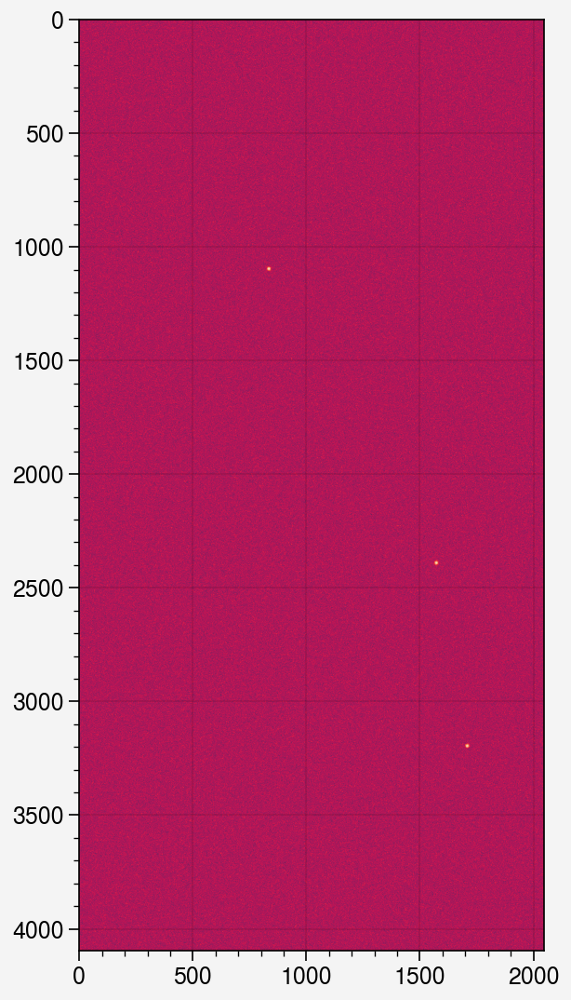

In [11]:
fig, axs = pplt.subplots()
axs.imshow(np.arcsinh(d * np.sqrt(wgt)), cmap="rocket")

In [12]:
import os
coadd_pth = (
    "/gpfs/mnt/gpfs02/astro/workarea/beckermr/des-y6-analysis/2022_02_04_imsims_tests_desy6/sim_outputs/"
    "des-pizza-slices-y6-v12/DES2359-6539/sources-i/OPS/multiepoch/Y6A1/r4907/DES2359-6539/p01/coadd/"
    "DES2359-6539_r4907p01_i.fits"
)

d = fitsio.read(coadd_pth)
wgt = fitsio.read(coadd_pth, ext=2)

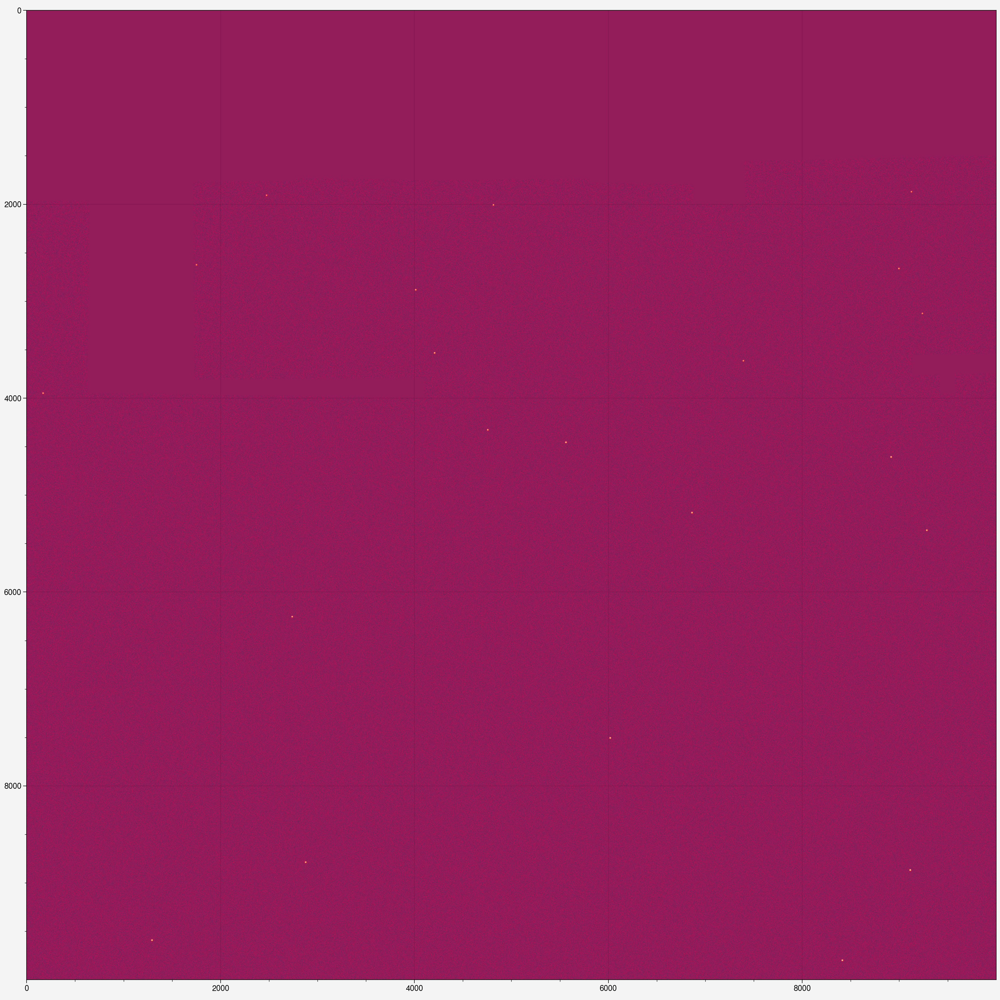

In [13]:
fig, axs = pplt.subplots(figsize=(16, 16))
axs.imshow(np.arcsinh(d * np.sqrt(wgt)), cmap="rocket")

In [14]:
h = fitsio.read_header(coadd_pth)

In [15]:
h


SIMPLE  =                    T / This is a FITS file
BITPIX  =                  -32 / 
NAXIS   =                    2 / 
NAXIS1  =                10000 / NUMBER OF ELEMENTS ALONG THIS AXIS
NAXIS2  =                10000 / NUMBER OF ELEMENTS ALONG THIS AXIS
EXTEND  =                    T / This file may contain FITS extensions
EQUINOX =               2000.0 / Mean equinox
MJD-OBS =       56889.27745469 / Modified Julian date at start
RADESYS = 'ICRS'               / Astrometric system
CTYPE1  = 'RA---TAN'           / WCS projection type for this axis
CUNIT1  = 'deg'                / Axis unit
CRVAL1  =           359.876888 / World coordinate on this axis
CRPIX1  =               5000.5 / Reference pixel on this axis
CD1_1   =  -7.305555555556E-05 / Linear projection matrix
CD1_2   =                  0.0 / Linear projection matrix
CTYPE2  = 'DEC--TAN'           / WCS projection type for this axis
CUNIT2  = 'deg'                / Axis unit
CRVAL2  =           -65.661111 / World coordinate

In [16]:
import meds

In [17]:
m = meds.MEDS("./sim_outputs/meds/y6a2/DES2359-6539/DES2359-6539_i_meds-y6a2.fits.fz")

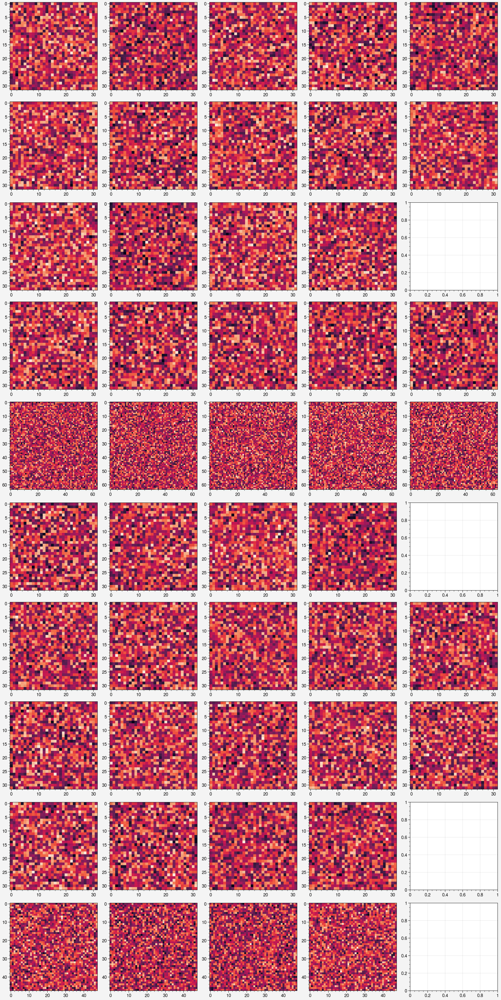

In [34]:
fig, axs = pplt.subplots(nrows=10, ncols=5, share=0)

start = 450
for i in range(10):
    for j in range(min(m["ncutout"][start+i]-1, 5)):
        im = m.get_cutout(start+i, j+1, type="image")
        wgt = m.get_cutout(start+i, j+1, type="weight")
        ax = axs[i, j]
        ax.imshow(np.arcsinh(im * np.sqrt(wgt)), cmap="rocket")
    

In [26]:
m["ncutout"].max()

9